In [1]:
import numpy as np
import matplotlib.pyplot as plt
import torchvision.transforms as T

import torch
import torchvision.datasets as datasets
import kornia as K

from PIL import Image
from torchvision import utils
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torchvision.utils import make_grid


from model.Layer1 import Layer1
from model.Layer2 import Layer2
from model.Layer3 import Layer3

from utils.data import ZCA_Loader

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

import os

In [ ]:
#data = torch.load('data/tiny-imagenet-200/zca_images.pt')
#print(data.shape)

torch.Size([100000, 3, 64, 64])


In [ ]:
#data_np = data.numpy()
#for i in range(10):
#    np.save(f'data/tiny-imagenet-200/zca_images{i+1}.npy', data_np[10000*i:10000*(i+1)])

In [2]:
Dx = 64
m11 = 768
m12 = 768
m21 = 768
m22 = 768
m31 = 768
m32 = 768

# load pretrained layers


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
folder = "runs/14/"
layer1 = Layer1(32, 0, 1, R_lr=0, lmda=0, device=device, save_dir='') # ignore those parameters
layer2 = Layer2(32, 0, 1, R_lr=0, lmda=0, device=device, save_dir='') # ignore those parameters
layer3 = Layer3(32, 0, 1, R_lr=0, lmda=0, device=device, save_dir='') # ignore those parameters

layer1.load_state_dict(torch.load(folder + "layer1_1_f9_01.pt"))
layer2.load_state_dict(torch.load(folder + "layer1_2_f9_01.pt"))
layer3.load_state_dict(torch.load(folder + "layer1_3_f9_01.pt"))


<All keys matched successfully>

In [4]:
torch.load(folder + "layer1_1_f9_01.pt")['U.weight'].shape

torch.Size([768, 3, 3, 3])

In [7]:
zca_data = ZCA_Loader('data/tiny-imagenet-200/zca_images.pt')

batch_size = 32

train_loader = torch.utils.data.DataLoader(
        zca_data, batch_size=batch_size, shuffle=True,
        num_workers=8, pin_memory=True)

In [6]:
img = next(iter(train_loader))
print(img.shape)

torch.Size([32, 3, 64, 64])


In [8]:
r1, r2, r3, r4, r5, r6 = [], [], [], [], [], []

for idx, img_batch in enumerate(train_loader):
    # show the percentage of completion
    if idx % 100 == 0:
        print("Progress: {:.2f}%".format(100 * idx / len(train_loader)))
    
    img_batch = img_batch.to(device)
    for t in range(2):
        # obtain states in the step t-1
        if t == 0:
            Rt_1_1 = torch.zeros((batch_size, m11, Dx, Dx), device=device)
            Rt_1_2 = torch.zeros((batch_size, m21, Dx//2, Dx//2), device=device)
            Rt_1_3 = torch.zeros((batch_size, m31, Dx//4, Dx//4), device=device)
        else:
            Rt_1_1 = layer1.R.data.clone().detach()
            Rt_1_2 = layer2.R.data.clone().detach()
            Rt_1_3 = layer3.R.data.clone().detach()
        
        Td_1 = (layer2.U(Rt_1_2)).clone().detach() #predicted cause of layer1 based on the states of layer2
        Td_2 = (layer3.U(Rt_1_3)).clone().detach() #predicted cause of layer2 based on the states of layer3
        Td_3 = layer3.u.data.clone().detach()   #predicted cause of layer3, that is the cause at previous step 
        
        # infer states and causes using Fista
        
        if t  == 0:
            #print("inference start")
            x1, u1, xp1 = layer1.Fista_(img_batch, Rt_1_1, Td_1 , t, )
            #print("inference done")
            img4layer2 = layer1.u.data.clone().detach()
            
            img4layer2_old = layer1.u.data.clone().detach()

            x2, u2, xp2 = layer2.Fista_(img4layer2, Rt_1_2, Td_2, t, )
            img4layer3 = layer2.u.data.clone().detach()
            
            img4layer3_old = layer2.u.data.clone().detach()
            x3, u3, xp3 = layer3.Fista_(img4layer3, Rt_1_3, Td_3, t, )
        else:
            #print("inference start")
            x12, u12, xp12 = layer1.Fista_(img_batch, Rt_1_1, Td_1 , t, )
            print("inference done")
            img4layer2 = layer1.u.data.clone().detach()

            x22, u22, xp22 = layer2.Fista_(img4layer2, Rt_1_2, Td_2, t, )
            img4layer3 = layer2.u.data.clone().detach()
            x32, u32, xp32 = layer3.Fista_(img4layer3, Rt_1_3, Td_3, t, )
            """
            x32 = x3
            u32 = u3
            xp32 = xp3
            
            Rt_1_2 = layer2.R.data.clone().detach()
            Td_2 = (layer3.U(Rt_1_3)).clone().detach()
            x22, u22, xp22 = layer2.Fista_(img4layer2_old, Rt_1_2, Td_2, t, )
            img4layer3 = layer2.u.data.clone().detach()
            
            Rt_1_1 = layer1.R.data.clone().detach()
            Td_1 = (layer2.U(Rt_1_2)).clone().detach()
            x12, u12, xp12 = layer1.Fista_(img_batch, Rt_1_1, Td_1 , t, )
            img4layer2 = layer1.u.data.clone().detach()
            #Rt_1_3 = layer3.R.data.clone().detach()
            """
            
            #x1 = torch.cat((x1,x12),0)
            #u1 = torch.cat((u1,u12),0)
            #xp1 = torch.cat((xp1,xp12),0)
            
            #x2 = torch.cat((x2,x22),0)
            #u2 = torch.cat((u2,u22),0)
            #xp2 = torch.cat((xp2,xp22),0)
            
            #x3 = torch.cat((x3,x32),0)
            #u3 = torch.cat((u3,u32),0)
            #xp3 = torch.cat((xp3,xp32),0)
            
            #Rt_1_1 = torch.cat((torch.zeros((batch_size, m11, Dx, Dx), device=device),Rt_1_1),0)
            #Rt_1_2 = torch.cat((torch.zeros((batch_size, m21, Dx//2, Dx//2), device=device),Rt_1_2),0)
            #Rt_1_3 = torch.cat((torch.zeros((batch_size, m31, Dx//4, Dx//4), device=device),Rt_1_3),0)
            
            #img_batch = torch.cat((img_batch,img_batch),0)
            #img4layer2 = torch.cat((img4layer2_old,img4layer2),0)
            #img4layer3 = torch.cat((img4layer3_old,img4layer3),0)
            
            recon_11 = layer1.U(x12)
            recon_12 = layer1.U(layer1.unpool(layer1.B(u12),layer1.index))
            recon_21 = layer1.U(layer1.unpool(layer1.B(layer2.U(x22)),layer1.index))#layer1.U(layer1.B(layer2.U(x22)))
            recon_22 = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(u22),layer2.index))),layer1.index))#layer1.U(layer1.B(layer2.U(layer2.B(u22))))
            recon_31  = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U(x32)),layer2.index))),layer1.index))#layer1.U(layer1.B(layer2.U(layer2.B(layer3.U(x32)))))
            recon_32  = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U(layer3.unpool(layer3.B(u32),layer3.index))),layer2.index))),layer1.index))
            
            r1.append(recon_11)
            r2.append(recon_12)
            r3.append(recon_21)
            r4.append(recon_22)
            r5.append(recon_31)
            r6.append(recon_32)
            
    if idx == 4:
        break
    

Progress: 0.00%
inference done
inference done
inference done
inference done
inference done


In [ ]:
r1 = torch.cat(r1)
r2 = torch.cat(r2)
r3 = torch.cat(r3)
r4 = torch.cat(r4)
r5 = torch.cat(r5)
r6 = torch.cat(r6)

In [ ]:
with torch.no_grad():
    for idx, img_batch in enumerate(train_loader):
        # show the percentage of completion
        if idx % 100 == 0:
            print("Progress: {:.2f}%".format(100 * idx / len(train_loader)))
        
        img_batch = img_batch.to(device)
        
        v1 = []
        v2 = []
        v3 = []
        v4 = []
        v5 = []
        v6 = []
        for show_i in range(768):
            x_show1 = x12.clone()
            maps = torch.zeros(x_show1.shape, device=device)
            maps[:,show_i,:,:] = 1
            v1.append(layer1.U(x_show1*maps))
            
            u_show1 = u12.clone()
            maps = torch.zeros(u_show1.shape, device=device)
            maps[:,show_i,:,:] = 1
            v2.append(layer1.U(layer1.unpool(layer1.B(u_show1*maps), layer1.index)))

            x_show2 = x22.clone()
            maps = torch.zeros(x_show2.shape, device=device)
            maps[:,show_i,:,:] = 1
            v3.append(layer1.U(layer1.unpool(layer1.B(layer2.U(x_show2*maps)), layer1.index)))
            
            u_show2 = u22.clone()
            maps = torch.zeros(u_show2.shape, device=device)
            maps[:,show_i,:,:] = 1
            v4.append(layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(u_show2*maps),layer2.index))),layer1.index)))
            
            x_show3 = x32.clone()
            maps = torch.zeros(x_show3.shape, device=device)
            maps[:,show_i,:,:] = 1
            v5.append(layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U(x_show3*maps)),layer2.index))),layer1.index)))
            
            u_show3 = u32.clone()
            maps = torch.zeros(u_show3.shape, device=device)
            maps[:,show_i,:,:] = 1
            v6.append(layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U(layer3.unpool(layer3.B(u_show3*maps),layer3.index))),layer2.index))),layer1.index)))

        v_11 = layer1.U.weight
        #v_12 = layer1.U(layer1.unpool(layer1.B.weight,layer1.index))
        #v_21 = layer1.U(layer1.unpool(layer1.B(layer2.U.weight),layer1.index))#layer1.U(layer1.B(layer2.U(x22)))
        #v_22 = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B.weight,layer2.index))),layer1.index))#layer1.U(layer1.B(layer2.U(layer2.B(u22))))
        #v_31 = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U.weight),layer2.index))),layer1.index))
        #v_32 = layer1.U(layer1.unpool(layer1.B(layer2.U(layer2.unpool(layer2.B(layer3.U(layer3.unpool(layer3.B.weight,layer3.index))),layer2.index))),layer1.index))
        
        break

Progress: 0.00%


In [5]:
with torch.no_grad():
        
        
    v_11 = layer1.U.weight
    #v_12 = layer1.U(layer1.unpool(layer1.B.weight,layer1.index))
    v_12 = layer1.U(layer1.B.weight)
    v_21 = layer1.U(layer1.B(layer2.U.weight))#layer1.U(layer1.B(layer2.U(x22)))
    v_22 = layer1.U(layer1.B(layer2.U(layer2.B.weight)))#layer1.U(layer1.B(layer2.U(layer2.B(u22))))
    v_31 = layer1.U(layer1.B(layer2.U(layer2.B(layer3.U.weight))))
    v_32 = layer1.U(layer1.B(layer2.U(layer2.B(layer3.U(layer3.B.weight)))))
    

In [11]:
v_21.shape

torch.Size([768, 3, 3, 3])

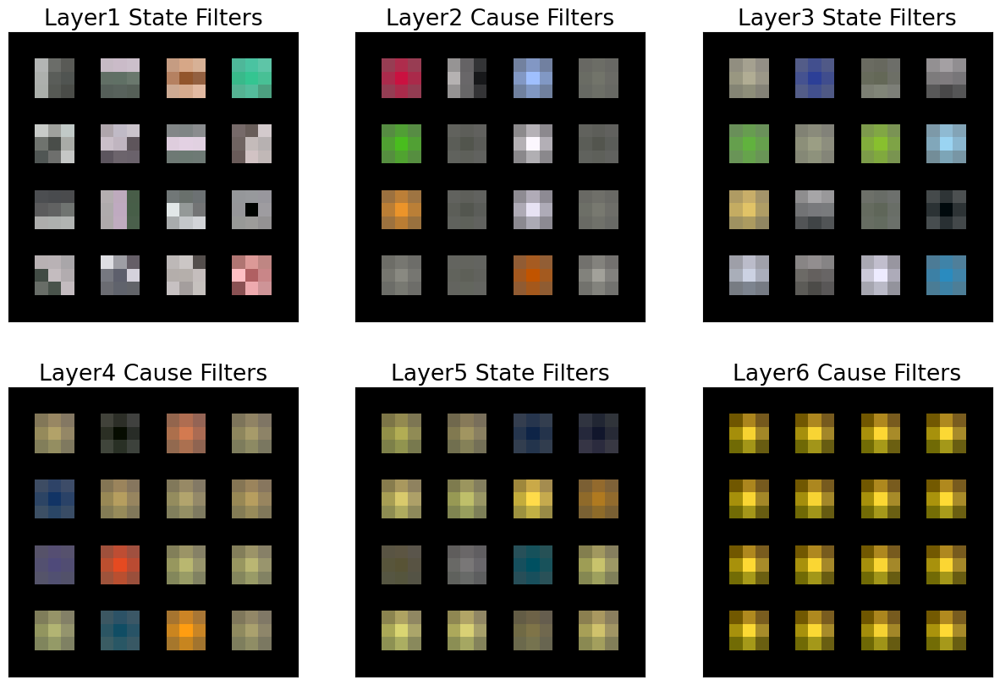

In [12]:
###############################################
idx = 561
n_row=4
index = torch.randint(770, (1,)).item()
v_1 = make_grid(v_11.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
v_2 = make_grid(v_12.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
v_3 = make_grid(v_21.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
v_4 = make_grid(v_22.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
v_5 = make_grid(v_31.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
v_6 = make_grid(v_32.clone()[index:index+16], nrow=4, normalize=True).cpu().numpy().transpose(1,2,0)
plt.rcParams['font.size'] = 16
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
plt.imshow(v_1)
plt.title('Layer1 State Filters')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,2)
plt.imshow(v_2)
plt.title(r'Layer2 Cause Filters')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,3)
plt.imshow(v_3)
plt.title(r'Layer3 State Filters')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,4)
plt.imshow(v_4)
plt.title(r'Layer4 Cause Filters')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,5)
plt.imshow(v_5)
plt.title(r'Layer5 State Filters')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,6)
plt.imshow(v_6)
plt.title(r'Layer6 Cause Filters')
plt.xticks([])
plt.yticks([])
plt.savefig('DPCN-imagenet-Filters1.pdf',bbox_inches='tight')

In [63]:
torch.sum(u32==0)/u32.numel()

tensor(0.1987, device='cuda:0')

In [29]:


def my_make_grid(v, filter_index, padding):
    #if "v" in f_name:
    #    v = torch.load(f_name)[filter_index][:30]
    #else:
    #    v = torch.load(f_name)[:30]
    v = v[filter_index][:16]
    normalized_images = []
    normalized_images = []
    for img in v:
        img = img.detach().cpu().numpy().transpose(1,2,0)
        img = (img - np.min(img)) / (np.max(img) - np.min(img) + 1e-12)
        normalized_images.append(img)

    # Calculate the dimensions of the grid
    num_rows = 4
    num_cols = 4
    padding = 3
    # Calculate the dimensions of each image with padding
    image_height = normalized_images[0].shape[0] + padding
    image_width = normalized_images[0].shape[1] + padding

    # Create the grid
    grid = np.zeros((num_rows * image_height + padding, num_cols * image_width + padding, 3))

    # Fill the grid with the normalized images
    for i, img in enumerate(normalized_images):
        row = (i // num_cols) * (image_height) + padding
        col = (i % num_cols) * (image_width) + padding
        grid[row:row+img.shape[0], col:col+img.shape[1]] = img
    return grid

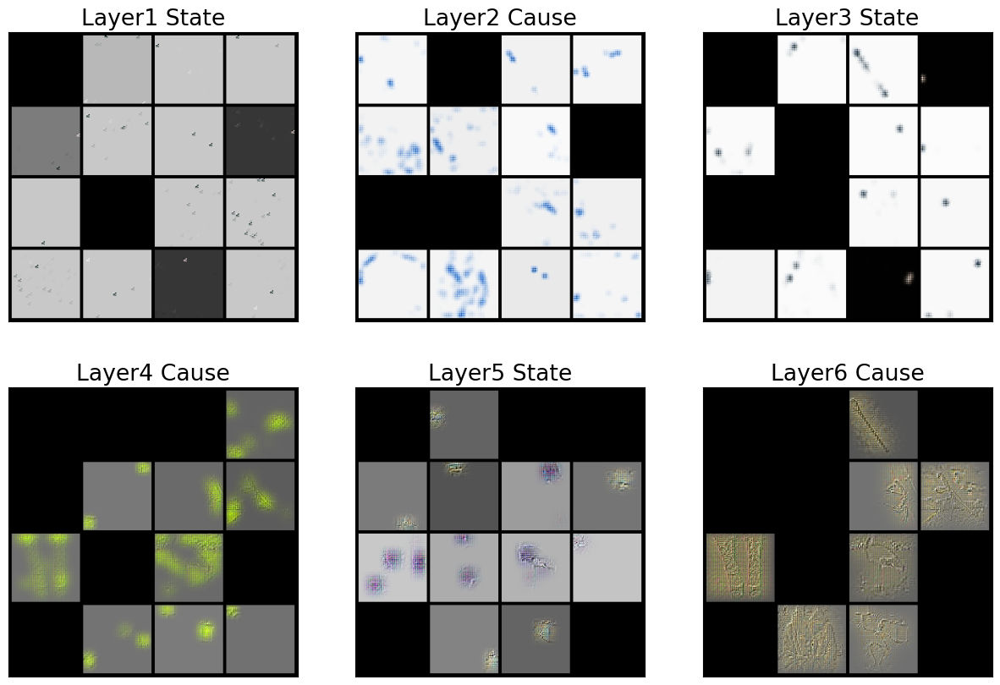

In [147]:
###############################################
idx = 561
n_row=4
pad = 5
v1[idx][0] = 0
v4[idx][1] = 0
v6[idx][9] = 0
v_1 = my_make_grid(v1, idx, pad)
v_2 = my_make_grid(v2, idx, pad)
v_3 = my_make_grid(v3, idx, pad)
v_4 = my_make_grid(v4, idx, pad)
v_5 = my_make_grid(v5, idx, pad)
v_6 = my_make_grid(v6, idx, pad)
plt.rcParams['font.size'] = 16
plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
plt.imshow(v_1)
plt.title('Layer1 State')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,2)
plt.imshow(v_2)
plt.title(r'Layer2 Cause')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,3)
plt.imshow(v_3)
plt.title(r'Layer3 State')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,4)
plt.imshow(v_4)
plt.title(r'Layer4 Cause')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,5)
plt.imshow(v_5)
plt.title(r'Layer5 State')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,6)
plt.imshow(v_6)
plt.title(r'Layer6 Cause')
plt.xticks([])
plt.yticks([])
plt.savefig('DPCN-imagenet-Filters.pdf',bbox_inches='tight')

In [92]:
test = np.mean(torch.abs(test1-test2).detach().cpu().numpy().transpose(1,2,0),axis=2)
print(test)

[[0.01376068 0.0117821  0.01037222 ... 0.0222837  0.01959445 0.02042494]
 [0.02455323 0.00673859 0.00300314 ... 0.02228822 0.0198263  0.0203595 ]
 [0.00295592 0.01896872 0.01018942 ... 0.02302461 0.01936817 0.02066144]
 ...
 [0.0200543  0.02019776 0.02011226 ... 0.0200541  0.01997518 0.01997815]
 [0.02006508 0.02019668 0.02012991 ... 0.01998359 0.0199765  0.01997751]
 [0.01997218 0.02009052 0.02001759 ... 0.0199771  0.0199725  0.01997273]]


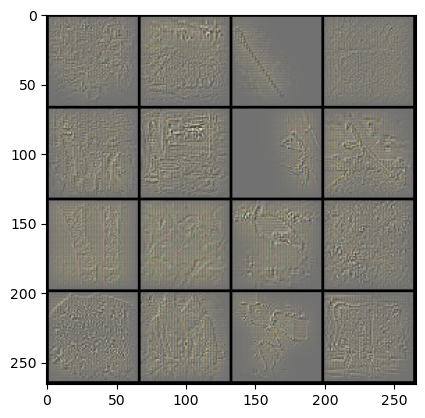

In [67]:
plt.imshow(make_grid(recon_32[:16],nrow=4,normalize=True).cpu().numpy().transpose(1,2,0))

In [8]:
img_batch = next(iter(train_loader))

In [9]:
print(recon_11.shape)

torch.Size([32, 3, 64, 64])


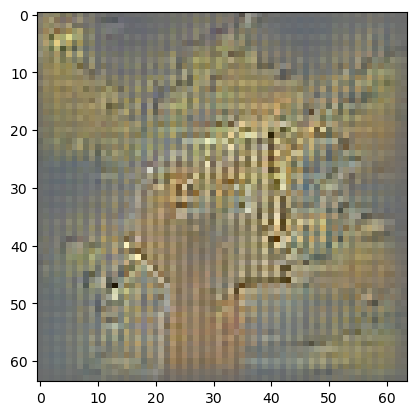

In [27]:
vis = recon_22[-2].cpu().detach().numpy().transpose(1,2,0)
vis = (vis - vis.min()) / (vis.max() - vis.min())
plt.imshow(vis)

In [53]:
recon11 = make_grid(recon_11, nrow=5, normalize=True).cpu().numpy()
recon12 = make_grid(recon_12, nrow=5, normalize=True).cpu().numpy()
recon21 = make_grid(recon_21, nrow=5, normalize=True).cpu().numpy()
recon22 = make_grid(recon_22, nrow=5, normalize=True).cpu().numpy()
recon31 = make_grid(recon_31, nrow=5, normalize=True).cpu().numpy()
recon32 = make_grid(recon_32, nrow=5, normalize=True).cpu().numpy()

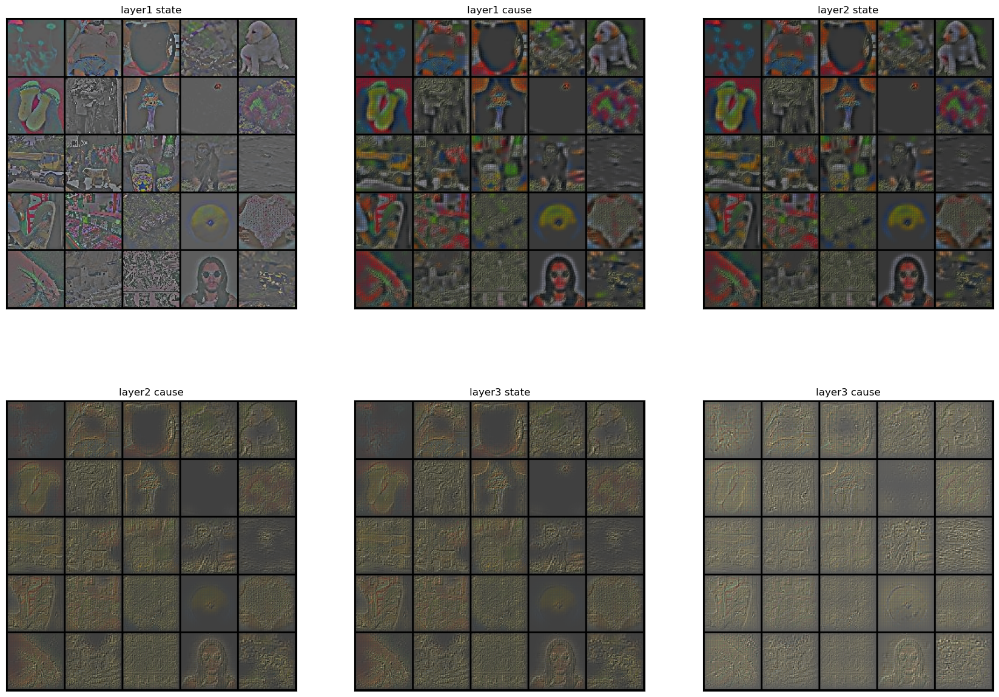

In [39]:
gam = 1.5
plt.figure(figsize=(21,15))
plt.subplot(2,3,1)
plt.imshow(np.transpose(recon11,[1,2,0])**1.3)
plt.title('layer1 state')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,2)
plt.imshow(np.transpose(recon12,[1,2,0])**gam)
plt.title(r'layer1 cause')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,3)
plt.imshow(np.transpose(recon21,[1,2,0])**gam)
plt.title(r'layer2 state')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,4)
plt.imshow(np.transpose(recon22,[1,2,0])**gam)
plt.title('layer2 cause')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,5)
plt.imshow(np.transpose(recon31,[1,2,0])**gam)
plt.title(r'layer3 state')
plt.xticks([])
plt.yticks([])
plt.subplot(2,3,6)
plt.imshow(np.transpose(recon32,[1,2,0])**gam)
plt.title(r'layer3 cause')
plt.xticks([])
plt.yticks([])
plt.show()

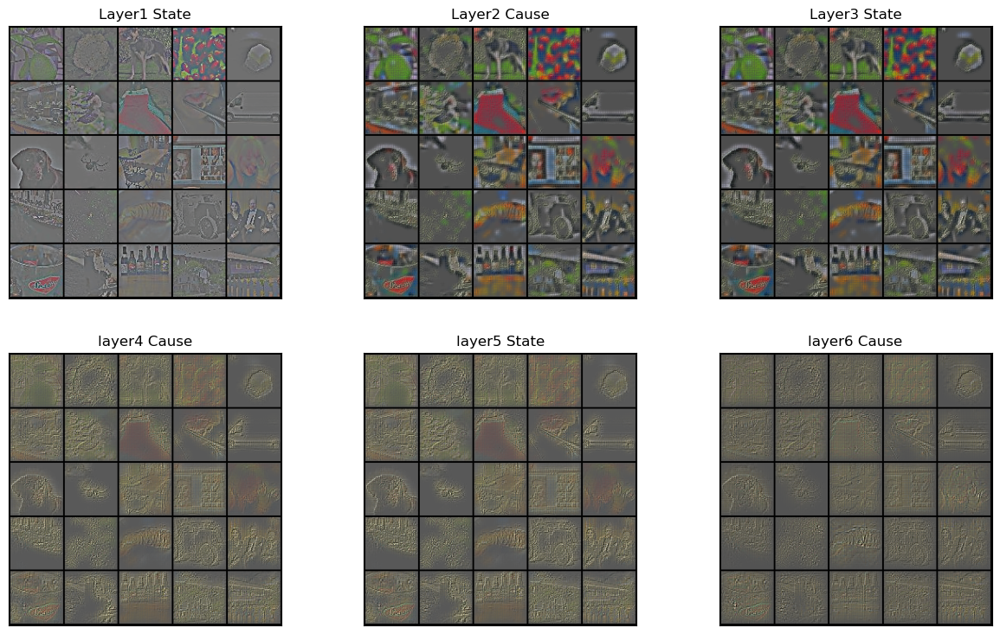

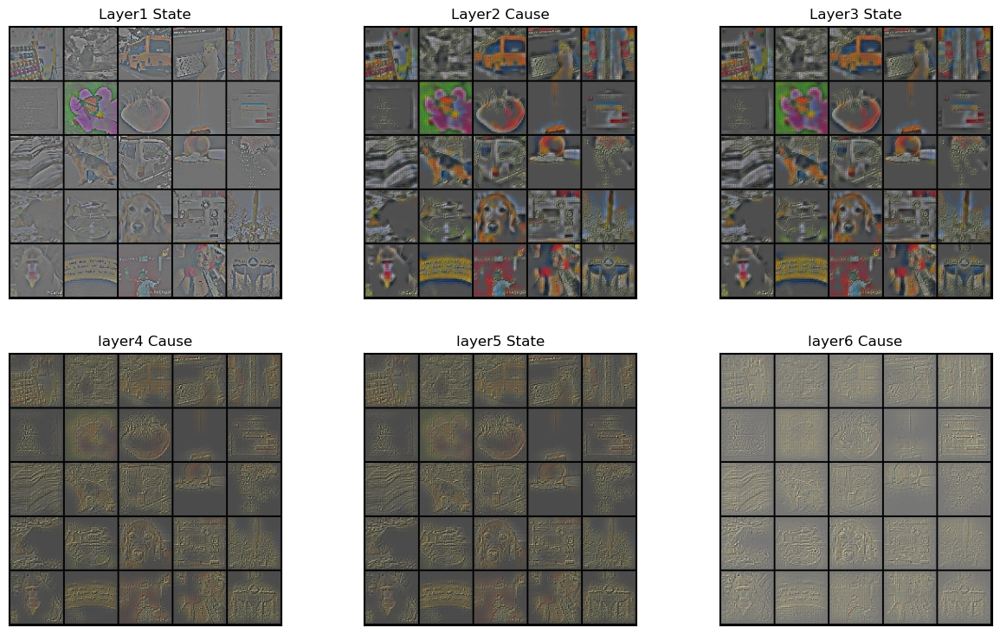

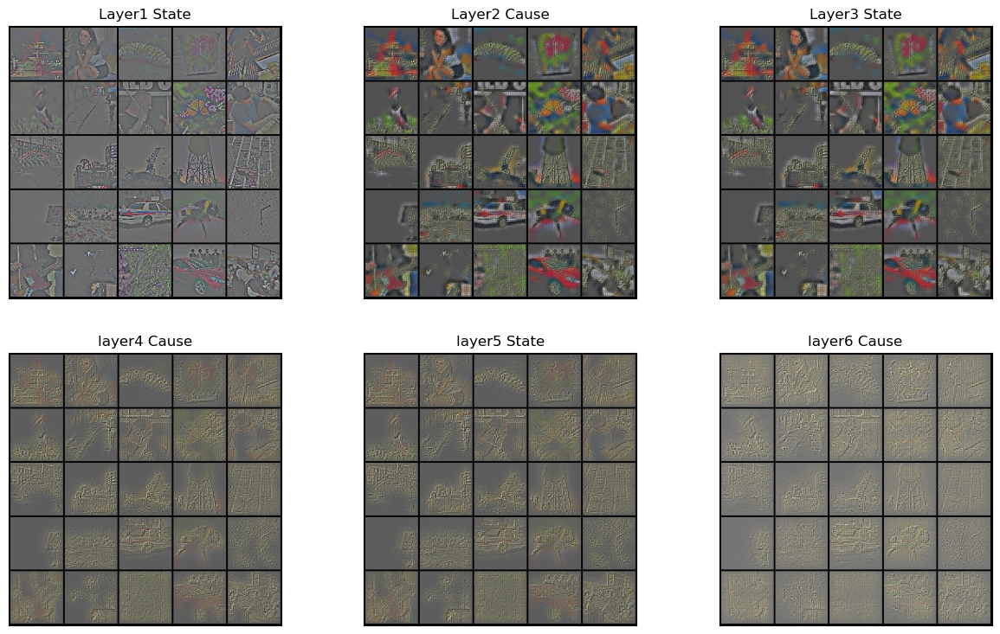

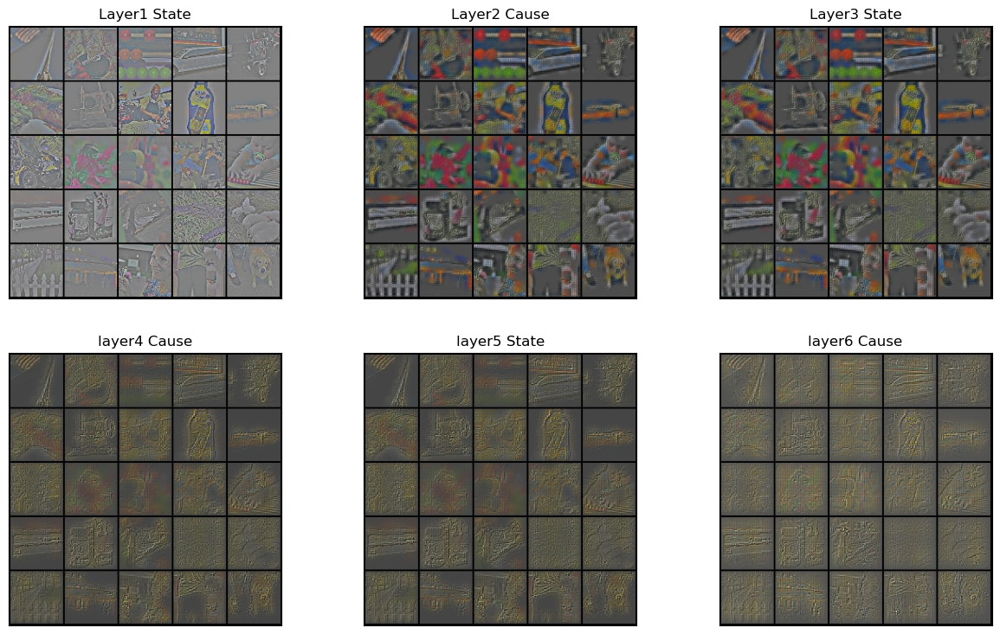

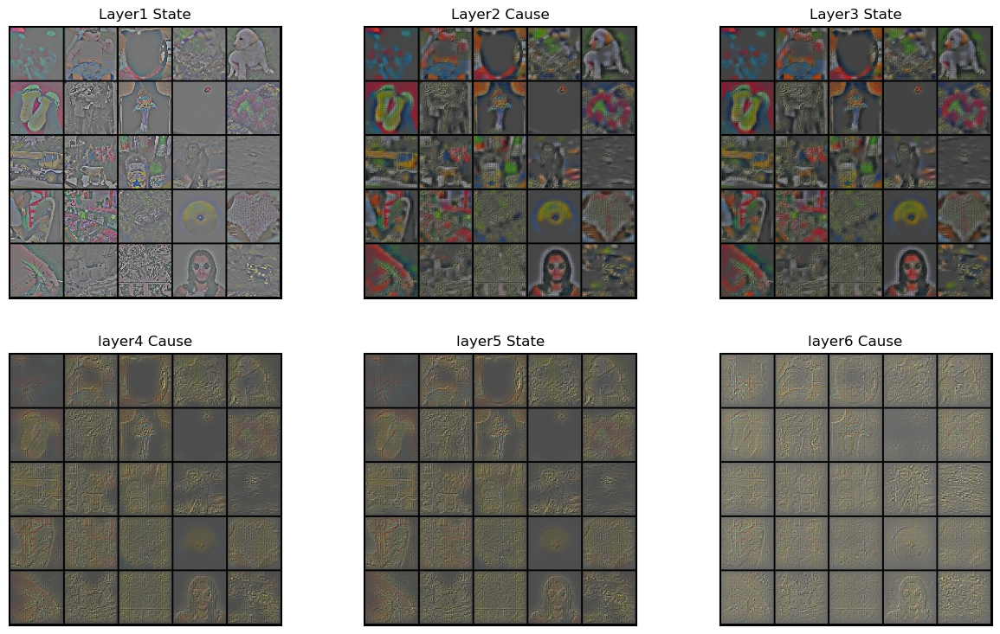

In [ ]:
gam = 1.3
for idx in range(5):

    recon11 = make_grid(r1[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    recon12 = make_grid(r2[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    recon21 = make_grid(r3[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    recon22 = make_grid(r4[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    recon31 = make_grid(r5[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    recon32 = make_grid(r6[25*idx:25*(idx+1)], nrow=5, normalize=True).cpu().numpy()
    plt.figure(figsize=(15,9))
    plt.subplot(2,3,1)
    plt.imshow(np.transpose(recon11,[1,2,0]))
    plt.title('Layer1 State')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(2,3,2)
    plt.imshow(np.transpose(recon12,[1,2,0])**gam)
    plt.title(r'Layer2 Cause')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(2,3,3)
    plt.imshow(np.transpose(recon21,[1,2,0])**gam)
    plt.title(r'Layer3 State')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(2,3,4)
    plt.imshow(np.transpose(recon22,[1,2,0])**gam)
    plt.title('layer4 Cause')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(2,3,5)
    plt.imshow(np.transpose(recon31,[1,2,0])**gam)
    plt.title(r'layer5 State')
    plt.xticks([])
    plt.yticks([])
    plt.subplot(2,3,6)
    plt.imshow(np.transpose(recon32,[1,2,0])**gam)
    plt.title(r'layer6 Cause')
    plt.xticks([])
    plt.yticks([])
    plt.savefig(f'imagenet_recon{idx+1}.pdf',bbox_inches='tight')
#plt.show()

In [30]:
class TinyImageNetTrainDataset(Dataset):
    def __init__(self, root_dir, wnids_file, transform=None):
        self.root_dir = root_dir  # Path to the "train" directory
        self.transform = transform
        self.class_to_idx = self._load_class_mapping(wnids_file)
        self.images = []
        self.labels = []
        
        # Load image paths and their corresponding labels
        self._load_data()

    def _load_class_mapping(self, wnids_file):
        # Load class IDs from wnids.txt and map to indices
        with open(wnids_file, 'r') as f:
            wnids = f.read().splitlines()
        return {wnid: idx for idx, wnid in enumerate(wnids)}

    def _load_data(self):
        # Iterate over each class folder to load images and labels
        for class_name in self.class_to_idx.keys():
            class_folder = os.path.join(self.root_dir, class_name, "images")
            # Check if the class folder exists
            if os.path.isdir(class_folder):
                # Get all JPEG images in the class folder
                for filename in os.listdir(class_folder):
                    if filename.endswith('.JPEG'):
                        self.images.append(os.path.join(class_folder, filename))
                        self.labels.append(self.class_to_idx[class_name])  # Append the index corresponding to the class

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = self.images[idx]
        image = Image.open(img_path).convert('RGB')  # Ensure images are in RGB format
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label
    
def parse_val_annotations(annotation_file):
    label_map = {}
    with open(annotation_file, 'r') as f:
        for line in f:
            parts = line.strip().split('\t')
            filename, label = parts[0], parts[1]
            label_map[filename] = label
    return label_map

# Step 1: Load class IDs from wnids.txt to get a consistent mapping
def load_class_mapping(wnids_file):
    with open(wnids_file, 'r') as f:
        wnids = [line.strip() for line in f]
    class_to_idx = {wnid: idx for idx, wnid in enumerate(wnids)}
    return class_to_idx



# Step 2: Update the custom dataset to use the class mapping
class TinyImageNetDataset(Dataset):
    def __init__(self, image_dir, annotation_file, wnids_file, transform=None):
        self.image_dir = image_dir
        self.transform = transform
        self.label_map = parse_val_annotations(annotation_file)
        self.class_to_idx = load_class_mapping(wnids_file)
        
        self.image_filenames = list(self.label_map.keys())
    
    def __len__(self):
        return len(self.image_filenames)
    
    def __getitem__(self, idx):
        img_name = self.image_filenames[idx]
        img_path = os.path.join(self.image_dir, img_name)
        image = Image.open(img_path)#.convert("RGB")
        
        # Convert label name to index using the consistent class mapping
        label_name = self.label_map[img_name]
        label = self.class_to_idx[label_name]
        
        if self.transform:
            image = self.transform(image)
            
        return image, label

#labels = parse_val_annotations('data/tiny-imagenet-200-DPCN-u3/val/val_annotations.txt')
#class_to_idx = load_class_mapping('data/tiny-imagenet-200-DPCN-u3/wnids.txt')

In [35]:
import torchvision.transforms as transforms
layer = 'u2'

traindir = f'data/tiny-imagenet-200-DPCN-{layer}/train'
batch_size = 32
transform = transforms.Compose([
    #transforms.Resize(256),  # Resize images to 256x256
    #transforms.CenterCrop(224),  # Crop the center 224x224
    #transforms.Resize((64, 64)),  # Resize images to 64x64
    transforms.ToTensor(),  # Convert PIL image to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # Normalize with ImageNet stats
                         std=[0.229, 0.224, 0.225])
])

train_dataset = datasets.ImageFolder(
        traindir,
        transform = transform
    )

train_loader = torch.utils.data.DataLoader(
        train_dataset, batch_size=batch_size, shuffle=True,
        num_workers=8, pin_memory=True)


wnids_file = f'data/tiny-imagenet-200-DPCN-{layer}/wnids.txt'
annotation_file = f'data/tiny-imagenet-200-DPCN-{layer}/val/val_annotations.txt'
testdir = f'data/tiny-imagenet-200-DPCN-{layer}/val/images'

test_dataset = TinyImageNetDataset(image_dir=testdir, annotation_file=annotation_file, wnids_file=wnids_file, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=8, pin_memory=True)


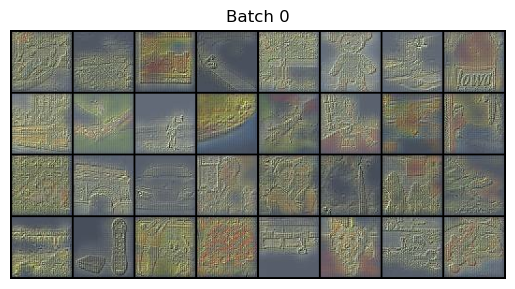

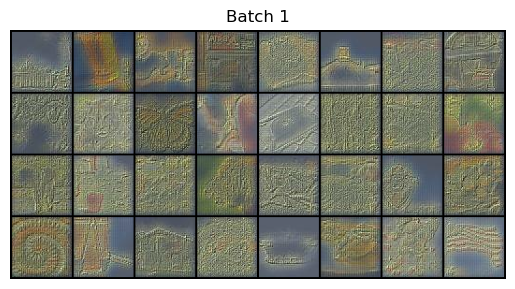

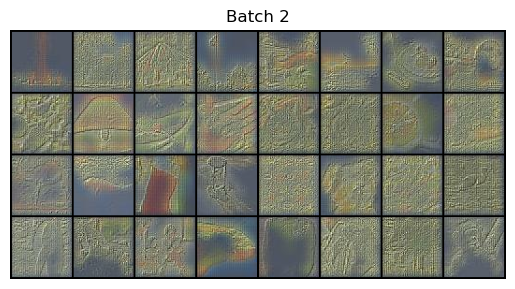

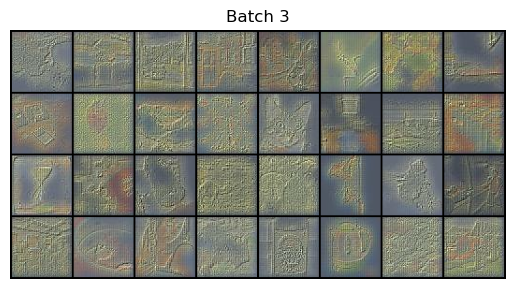

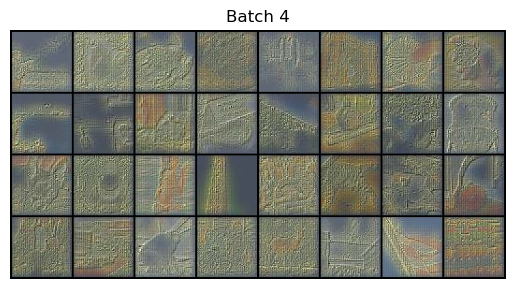

...

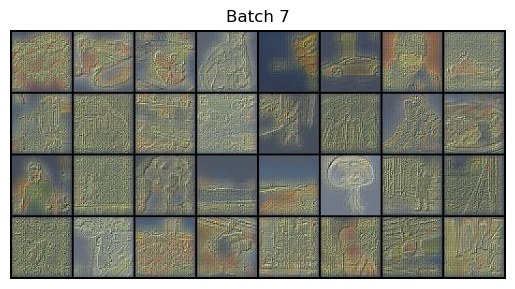

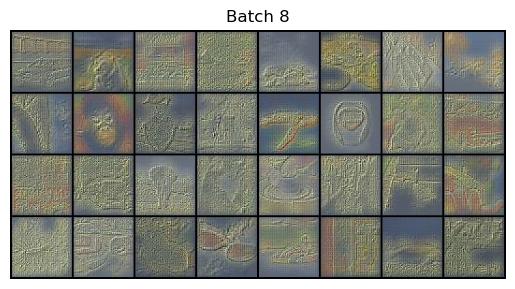

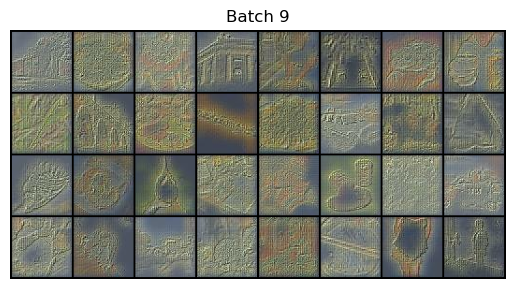

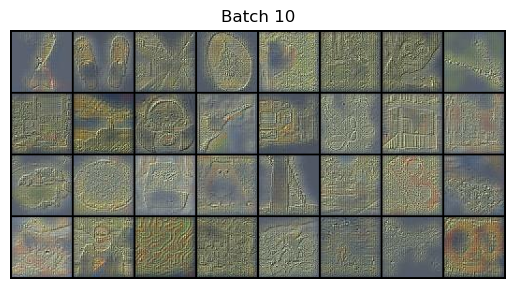

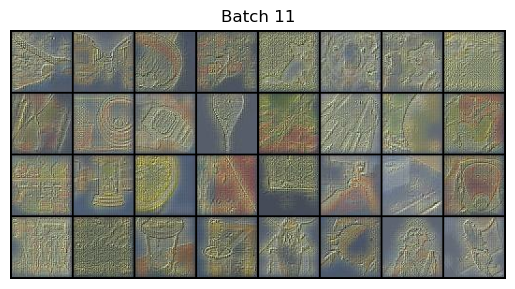

In [39]:
# visualize data
for i, data in enumerate(test_loader, 0):
    images, labels = data
    grid = make_grid(images, nrow=8, normalize=True)
    plt.imshow(grid.permute(1, 2, 0).cpu().numpy())
    plt.title(f"Batch {i}")
    plt.axis("off")
    plt.show()
    if i > 10:
        break

In [45]:
print(images[5].max(), images[0].min())

tensor(2.3585) tensor(-1.8097)


In [47]:
data = torch.load("data/tiny-imagenet-200/zca_images.pt")

In [53]:
print(data.shape)

torch.Size([100000, 3, 64, 64])


In [49]:
# separate data into ten parts
data_parts = torch.chunk(data, 10)

In [56]:
data_parts[0].shape

torch.Size([10000, 3, 64, 64])